In [1]:
#LIBRARIES:
#Tensors:
import torch
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as utils
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

#E(2)-steerable CNNs - librar"y:
from e2cnn import gspaces    
from e2cnn import nn as G_CNN   
import e2cnn

#Plotting in 2d/3d:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Ellipse
from matplotlib.colors import Normalize
import matplotlib.cm as cm

#Tools:
import datetime
import sys
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

#Own files:
import Kernel_and_GP_tools as GP
import My_Tools
import Steerable_CNP_Models as My_Models
import Training
import Evaluation

'''
SET DEVICE:
'''

if torch.cuda.is_available():
    DEVICE = torch.device("cuda:0")  
    print("Running on the GPU")
else:
    DEVICE = torch.device("cpu")
    print("Running on the CPU")

'''
DATA
'''
#Loading Data to data loaders:
BATCH_SIZE=16
GP_TRAIN_DATA_LOADER,GP_TEST_DATA_LOADER=GP.load_2d_GP_data(Id="37845",batch_size=BATCH_SIZE)
DATA_IDENTIFIER="GP_data_Id_37845"
GP_PARAMETERS={'l_scale':1,'sigma_var':1, 'kernel_type':"div_free",'obs_noise':1e-4,'B':None,'Ker_project':False}
'''
ENCODER
'''
#Set hyperparamters:
X_RANGE=[-4,4]
N_X_AXIS=20
L_SCALE_ENC=0.4
#Define the model:
Encoder=My_Models.Steerable_Encoder(l_scale=L_SCALE_ENC,x_range=X_RANGE,n_x_axis=N_X_AXIS)

'''
STEERABLE CNP
'''
#Set parameters for Steerable Decoder:
DIM_COV_EST=3
N=4
GEOM_KERNEL_SIZES=[7,9,11,15,17]
GEOM_NON_LINEARITY=['NormReLU']
HIDDEN_FIB_REPS=[[-1,-1],[-1,-1,1,1],[-1,-1,-1,1,1,1],[-1,-1,-1,1,1,1]]

geom_decoder=My_Models.Cyclic_Decoder(hidden_fib_reps=HIDDEN_FIB_REPS,kernel_sizes=GEOM_KERNEL_SIZES,dim_cov_est=DIM_COV_EST,non_linearity=GEOM_NON_LINEARITY,N=N)
geom_cnp=My_Models.Steerable_CNP(encoder=Encoder,decoder=geom_decoder,dim_cov_est=DIM_COV_EST)

'''
CONV CNP
'''
CONV_KERNEL_SIZES=[5,7,9,11]
LIST_HID_CHANNELS=[6,9,6]
CONV_NON_LINEARITY=['ReLU']

conv_decoder=My_Models.CNN_Decoder(list_hid_channels=LIST_HID_CHANNELS,kernel_sizes=CONV_KERNEL_SIZES,dim_cov_est=DIM_COV_EST,non_linearity=CONV_NON_LINEARITY)
conv_cnp=My_Models.Steerable_CNP(encoder=Encoder,decoder=conv_decoder,dim_cov_est=DIM_COV_EST)



'''
TRAINING PARAMETERS
'''

N_EPOCHS=30
N_ITERAT_PER_EPOCH=1000
MIN_N_CONTEXT_POINTS=2
MAX_N_CONTEXT_POINTS=40
LEARNING_RATE=1e-4
WEIGHT_DECAY=0.
SHAPE_REG=None
N_PLOTS=None
N_VAL_SAMPLES=200

#File path to save models:
FOLDER="Trained_Models/Comp_experiments/"

'''
Train Steerable CNP
'''
print("---------Train Steerable CNP--------")
geom_n_param=My_Tools.count_parameters(geom_decoder,print_table=True)

GEOM_FILENAME=FOLDER+"Comp_experiment_1_Steerable_CNP"
'''
_,_,geom_file_loc=Training.train_CNP(
Steerable_CNP=geom_cnp, 
train_data_loader=GP_TRAIN_DATA_LOADER,
val_data_loader=GP_TEST_DATA_LOADER, 
data_identifier=DATA_IDENTIFIER,
device=DEVICE,
Max_n_context_points=MAX_N_CONTEXT_POINTS,
Min_n_context_points=MIN_N_CONTEXT_POINTS,
n_epochs=N_EPOCHS, 
n_iterat_per_epoch=N_ITERAT_PER_EPOCH,
learning_rate=LEARNING_RATE, 
weight_decay=WEIGHT_DECAY,
shape_reg=SHAPE_REG,
n_plots=N_PLOTS,
n_val_samples=N_VAL_SAMPLES,
filename=GEOM_FILENAME)
'''

'''
Train Steerable CNP
'''
print("---------Train CONV CNP--------")

conv_n_param=My_Tools.count_parameters(conv_decoder,print_table=True)

CONV_FILENAME=FOLDER+"Comp_experiment_1_Conv_CNP"
'''
_,_,conv_file_loc=Training.train_CNP(
Steerable_CNP=conv_cnp, 
train_data_loader=GP_TRAIN_DATA_LOADER,
val_data_loader=GP_TEST_DATA_LOADER, 
data_identifier=DATA_IDENTIFIER,
device=DEVICE,
Max_n_context_points=MAX_N_CONTEXT_POINTS,
Min_n_context_points=MIN_N_CONTEXT_POINTS,
n_epochs=N_EPOCHS, 
n_iterat_per_epoch=N_ITERAT_PER_EPOCH,
learning_rate=LEARNING_RATE, 
weight_decay=WEIGHT_DECAY,
shape_reg=SHAPE_REG,
n_plots=N_PLOTS,
n_val_samples=N_VAL_SAMPLES,
filename=CONV_FILENAME)
'''




Running on the CPU
---------Train Steerable CNP--------
+--------------------+------------+
|      Modules       | Parameters |
+--------------------+------------+
|   decoder.0.bias   |     2      |
| decoder.0.weights  |    108     |
| decoder.1.log_bias |     2      |
|   decoder.2.bias   |     2      |
| decoder.2.weights  |    432     |
| decoder.3.log_bias |     4      |
|   decoder.4.bias   |     3      |
| decoder.4.weights  |    1692    |
| decoder.5.log_bias |     6      |
|   decoder.6.bias   |     3      |
| decoder.6.weights  |    3744    |
| decoder.7.log_bias |     6      |
|   decoder.8.bias   |     1      |
| decoder.8.weights  |    2022    |
+--------------------+------------+
Total Trainable Params: 8027
---------Train CONV CNP--------
+------------------+------------+
|     Modules      | Parameters |
+------------------+------------+
| decoder.0.weight |    450     |
|  decoder.0.bias  |     6      |
| decoder.2.weight |    1350    |
|  decoder.2.bias  |     9     

'\n_,_,conv_file_loc=Training.train_CNP(\nSteerable_CNP=conv_cnp, \ntrain_data_loader=GP_TRAIN_DATA_LOADER,\nval_data_loader=GP_TEST_DATA_LOADER, \ndata_identifier=DATA_IDENTIFIER,\ndevice=DEVICE,\nMax_n_context_points=MAX_N_CONTEXT_POINTS,\nMin_n_context_points=MIN_N_CONTEXT_POINTS,\nn_epochs=N_EPOCHS, \nn_iterat_per_epoch=N_ITERAT_PER_EPOCH,\nlearning_rate=LEARNING_RATE, \nweight_decay=WEIGHT_DECAY,\nshape_reg=SHAPE_REG,\nn_plots=N_PLOTS,\nn_val_samples=N_VAL_SAMPLES,\nfilename=CONV_FILENAME)\n'

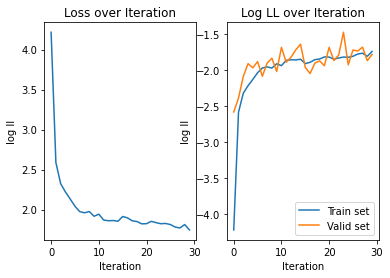

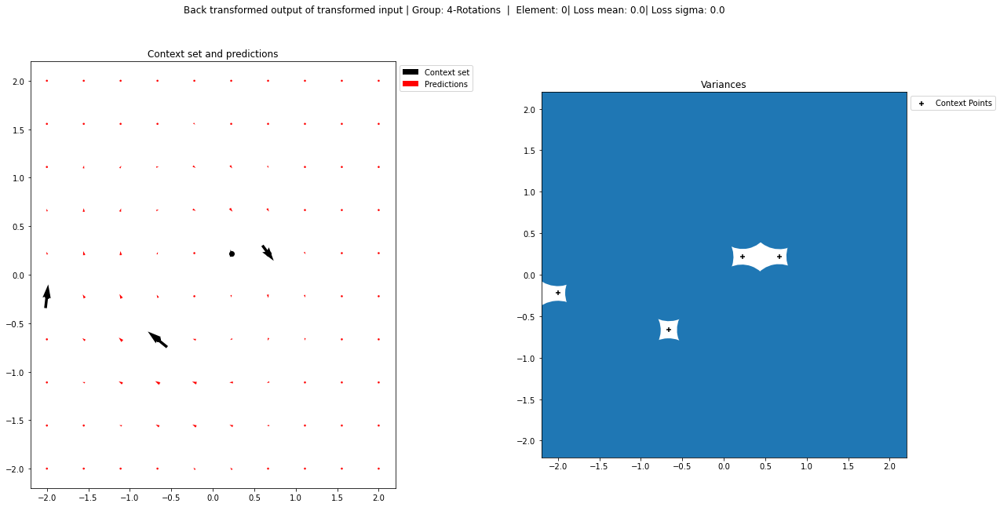

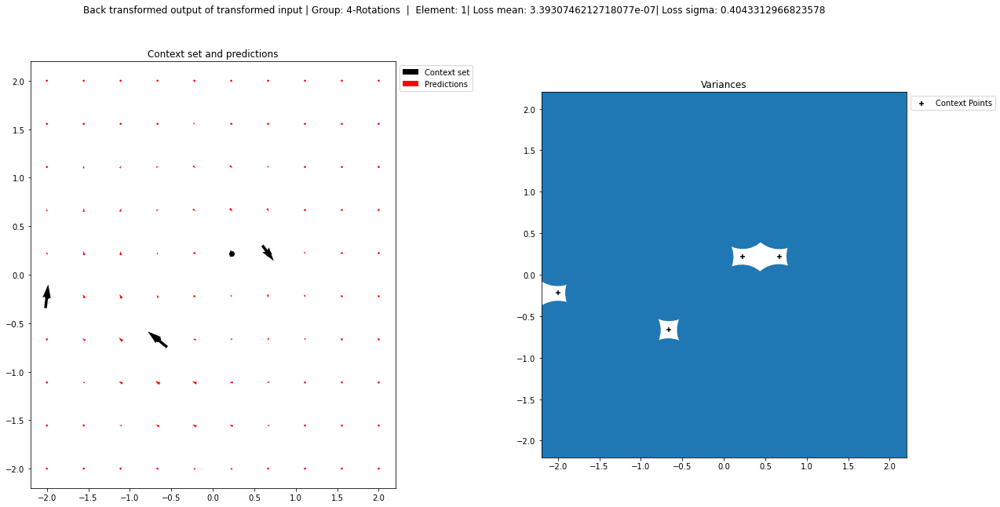

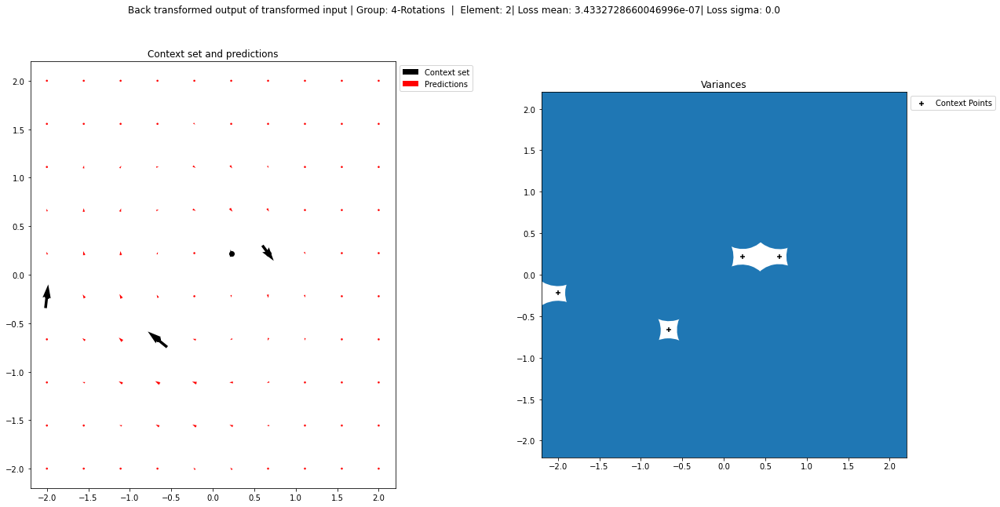

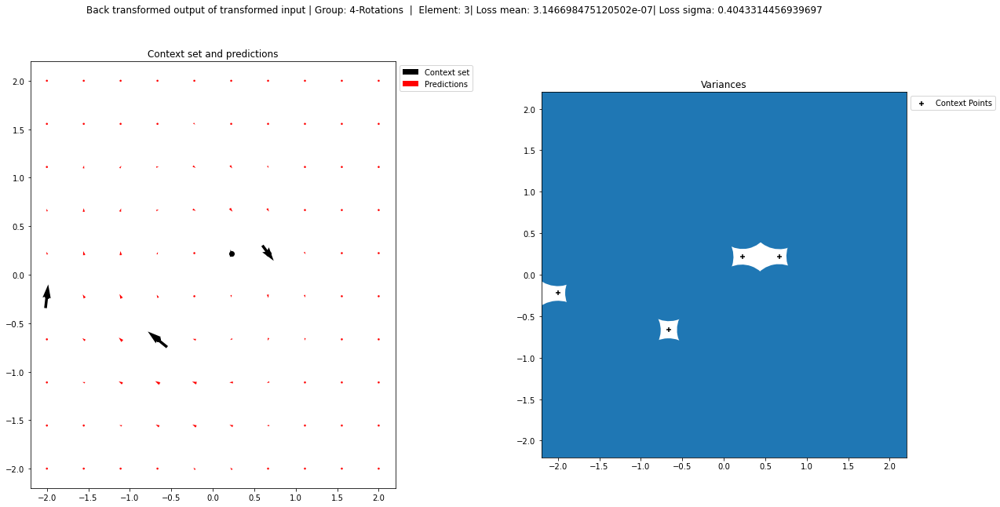

<Figure size 432x288 with 0 Axes>

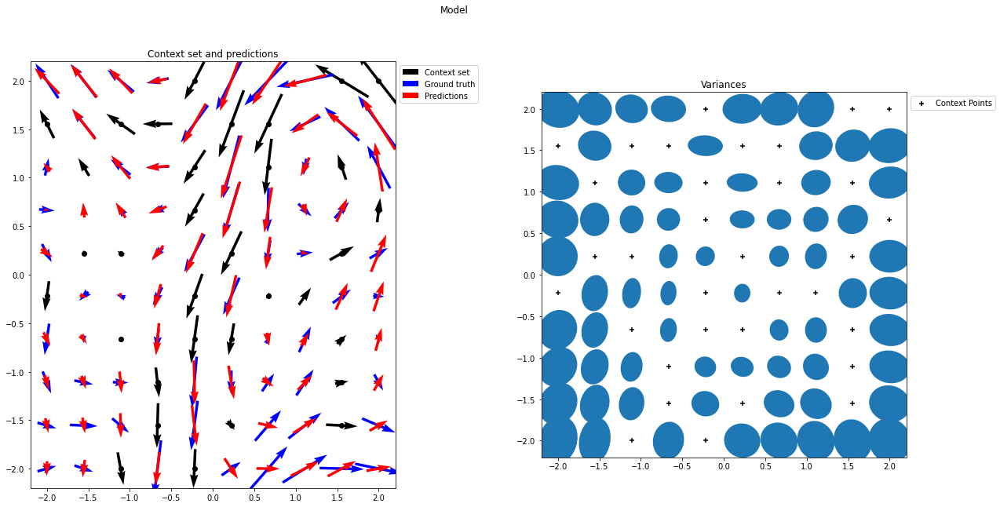

<Figure size 432x288 with 0 Axes>

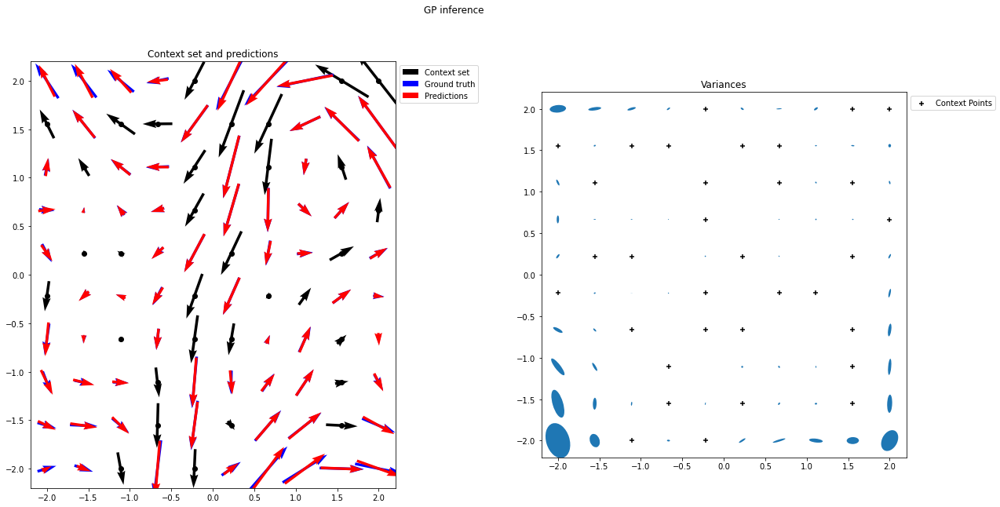

<Figure size 432x288 with 0 Axes>

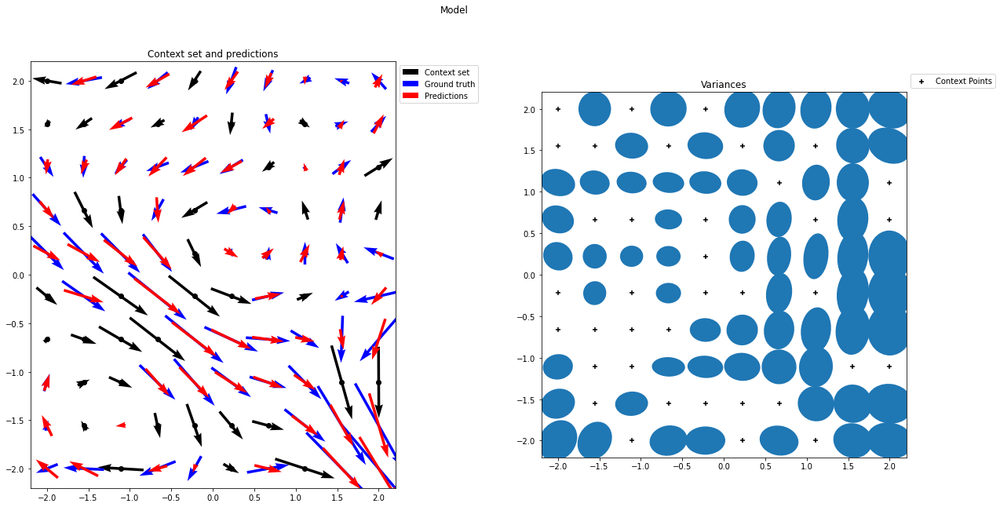

<Figure size 432x288 with 0 Axes>

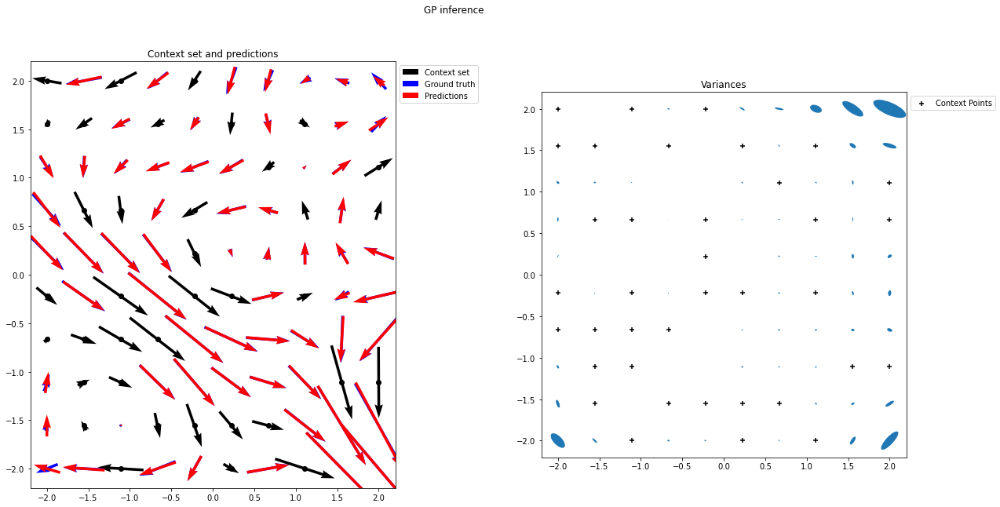

<Figure size 432x288 with 0 Axes>

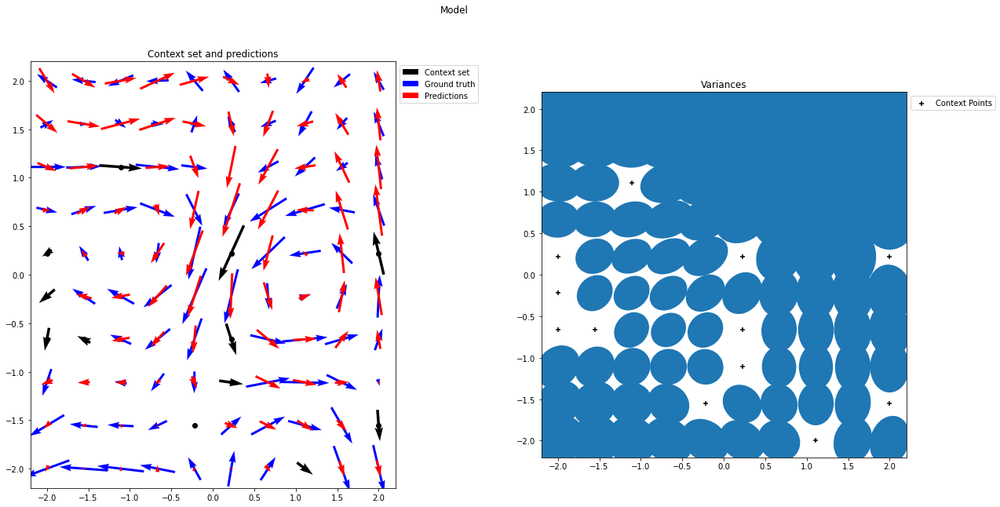

<Figure size 432x288 with 0 Axes>

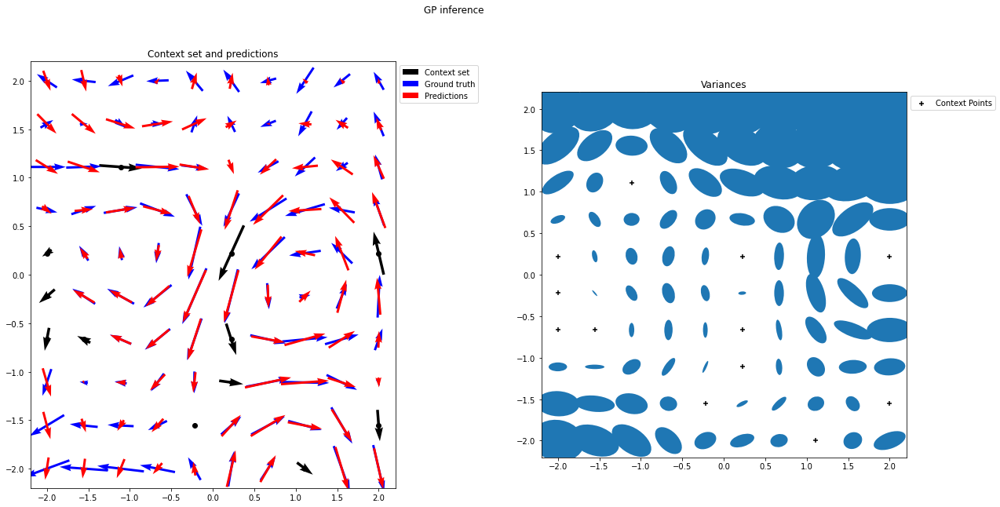

<Figure size 432x288 with 0 Axes>

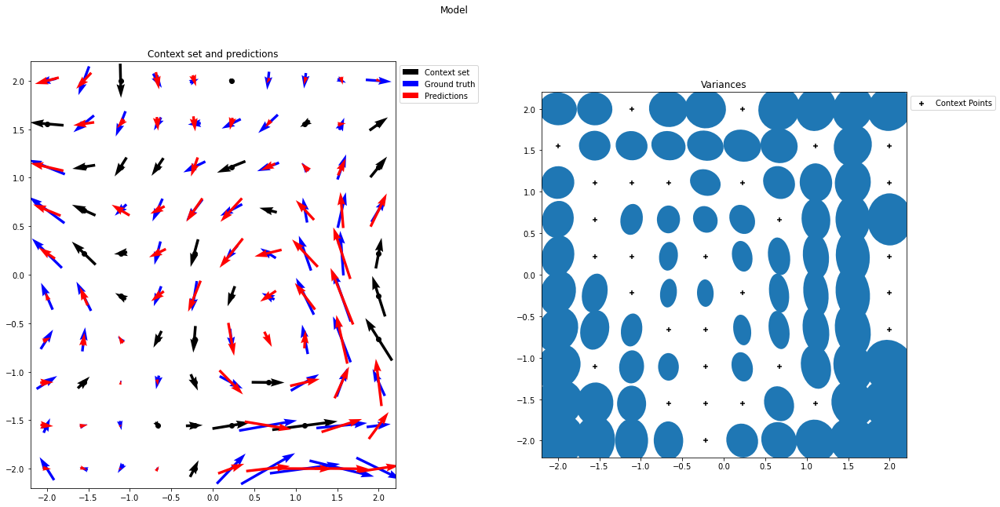

<Figure size 432x288 with 0 Axes>

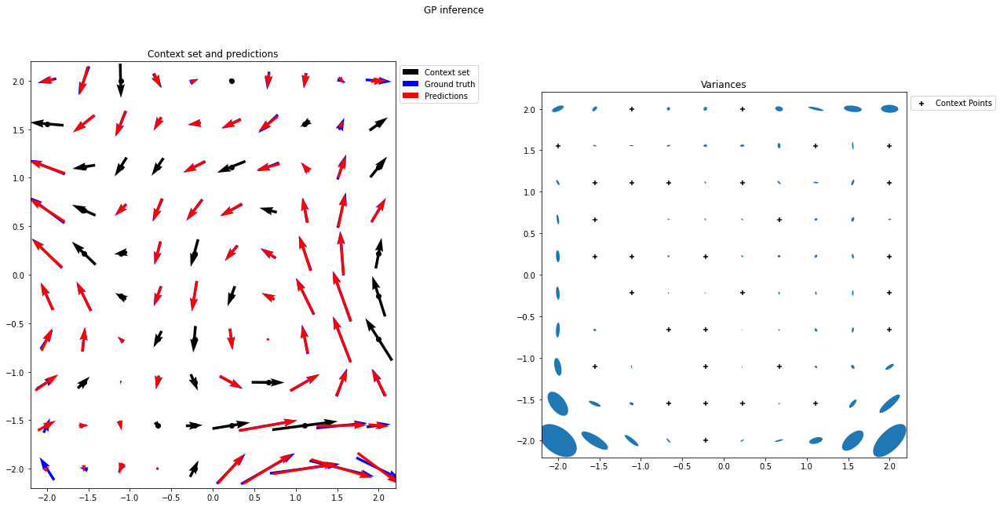

In [2]:

'''
#EVALUATE STEERABLE CNP:
'''
geom_file_loc="Trained_Models/Comp_experiments/Comp_experiment_1_Steerable_CNP_2020_07_24_13_03"
G_act=geom_decoder.G_act
in_repr=G_act.irrep(1)

geom_dict=torch.load(geom_file_loc,map_location=torch.device('cpu'))
geom_evaluater=Evaluation.Steerable_CNP_Evaluater(geom_dict,G_act,in_repr,GP_TEST_DATA_LOADER)
geom_evaluater.plot_loss_memory()
geom_evaluater.equiv_error_model(n_samples=4,plot_stable=True)
geom_evaluater.plot_test_random(n_samples=4,GP_parameters=GP_PARAMETERS)

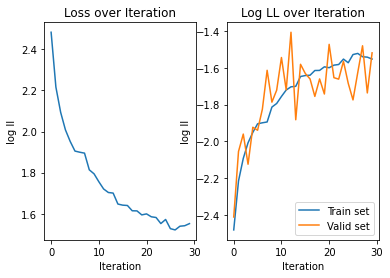

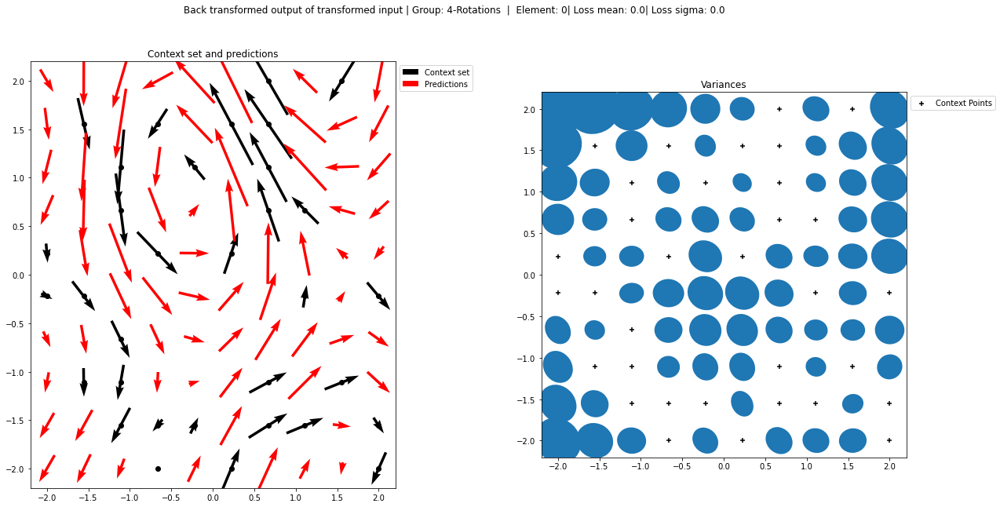

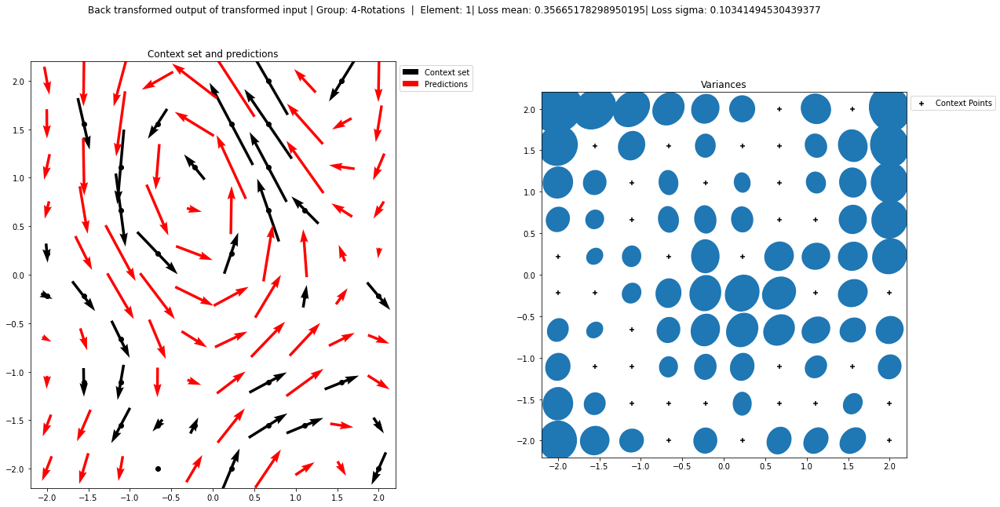

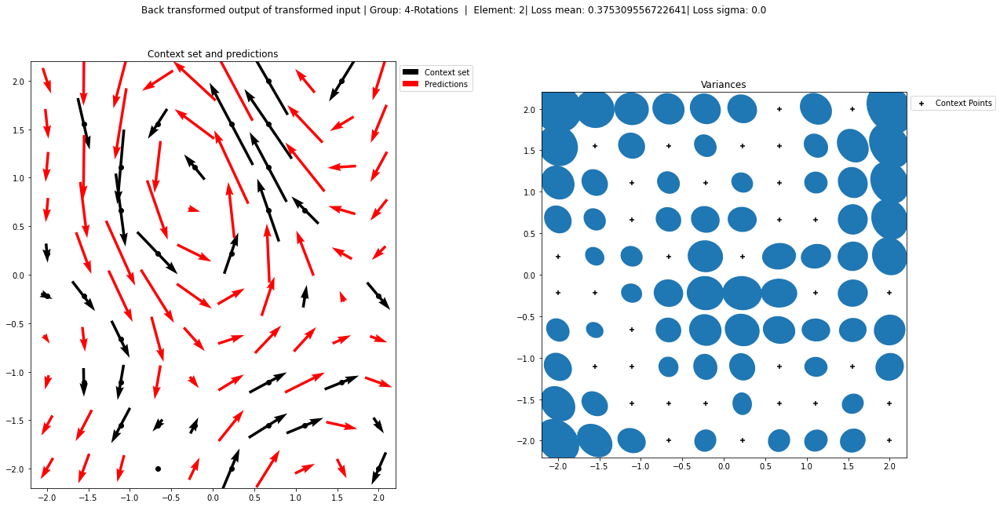

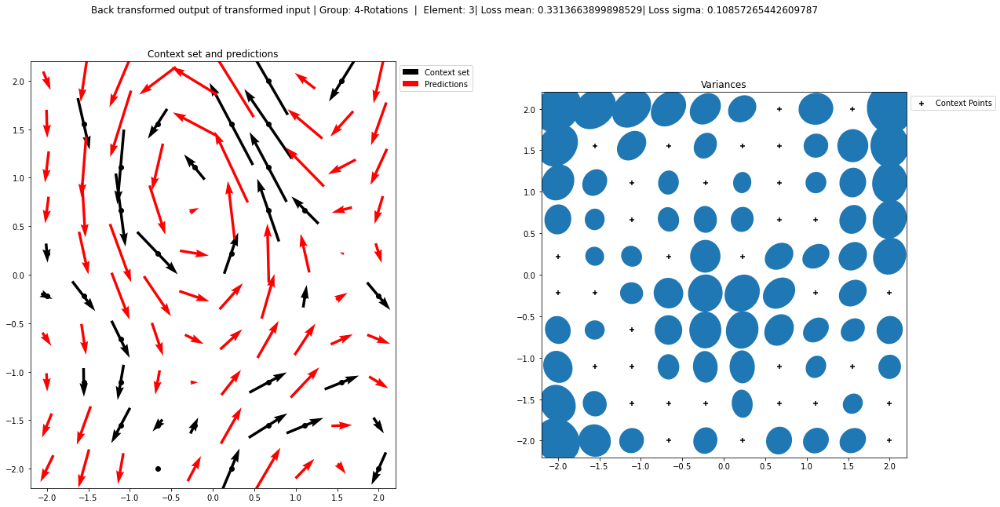

<Figure size 432x288 with 0 Axes>

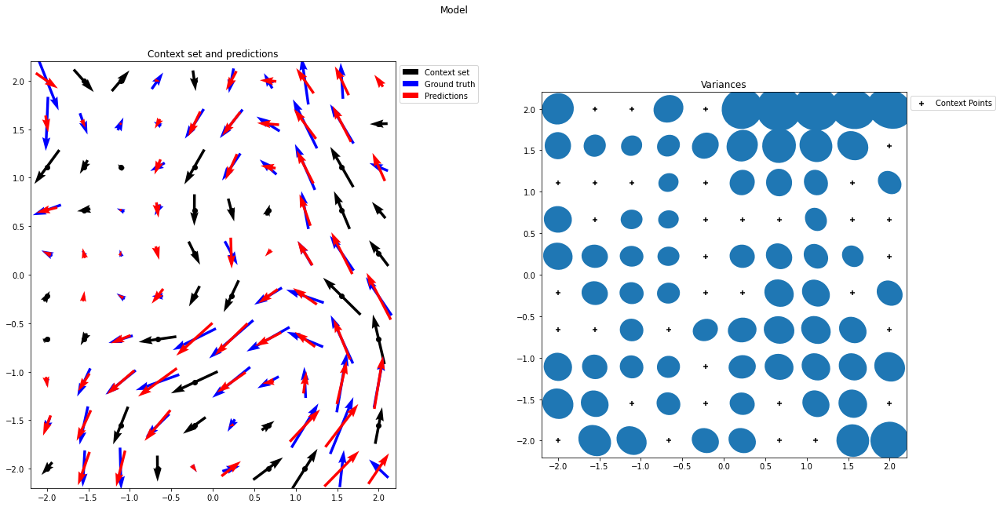

<Figure size 432x288 with 0 Axes>

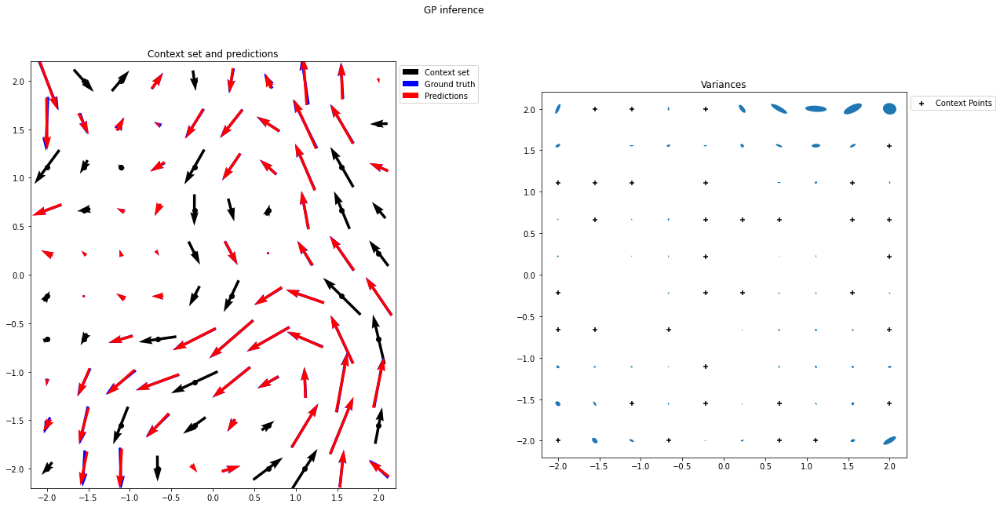

<Figure size 432x288 with 0 Axes>

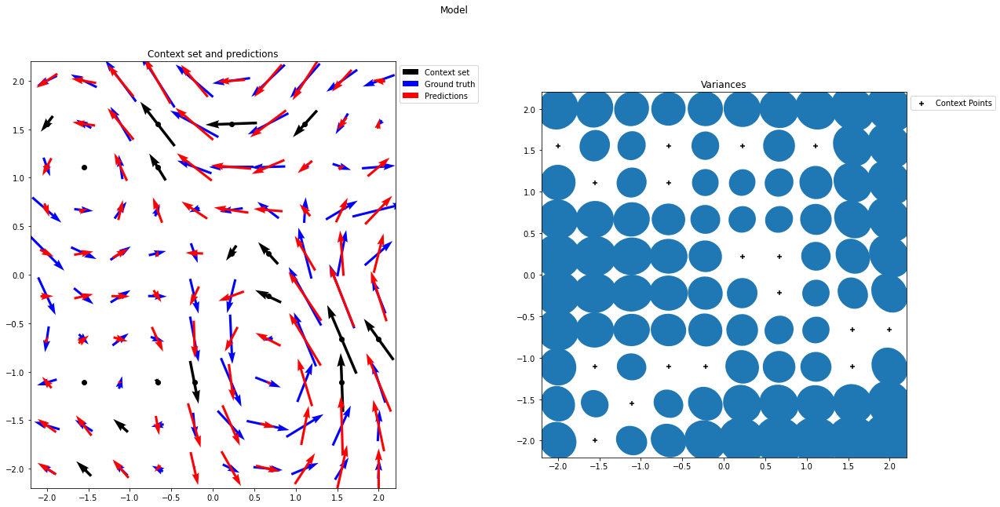

<Figure size 432x288 with 0 Axes>

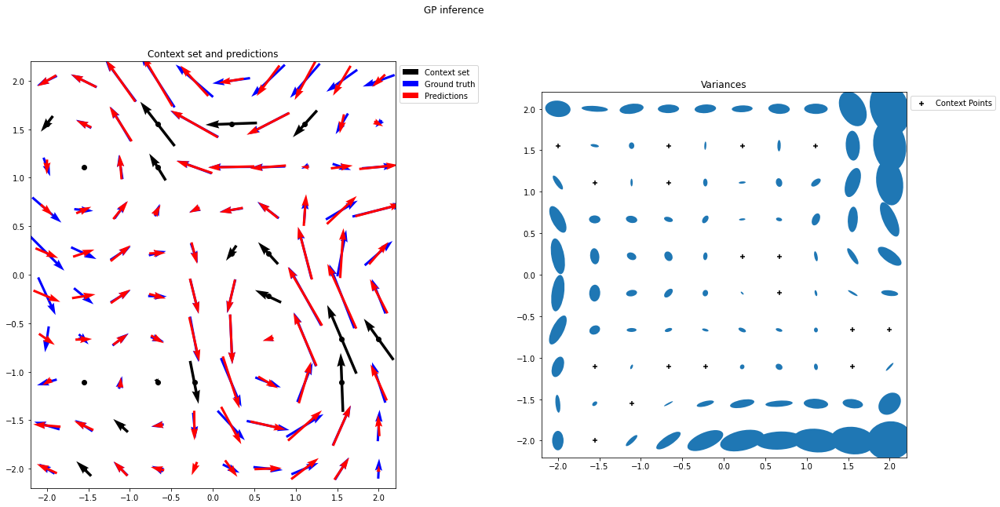

<Figure size 432x288 with 0 Axes>

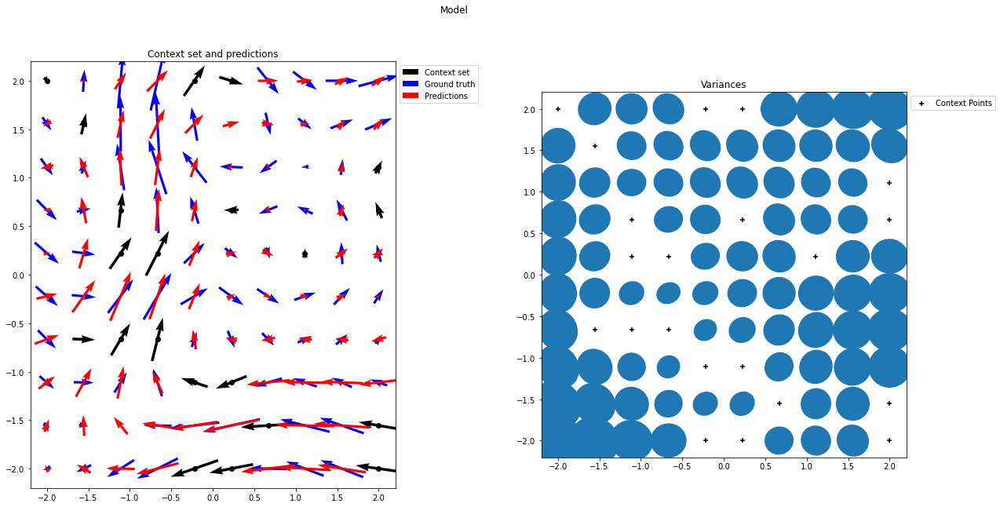

<Figure size 432x288 with 0 Axes>

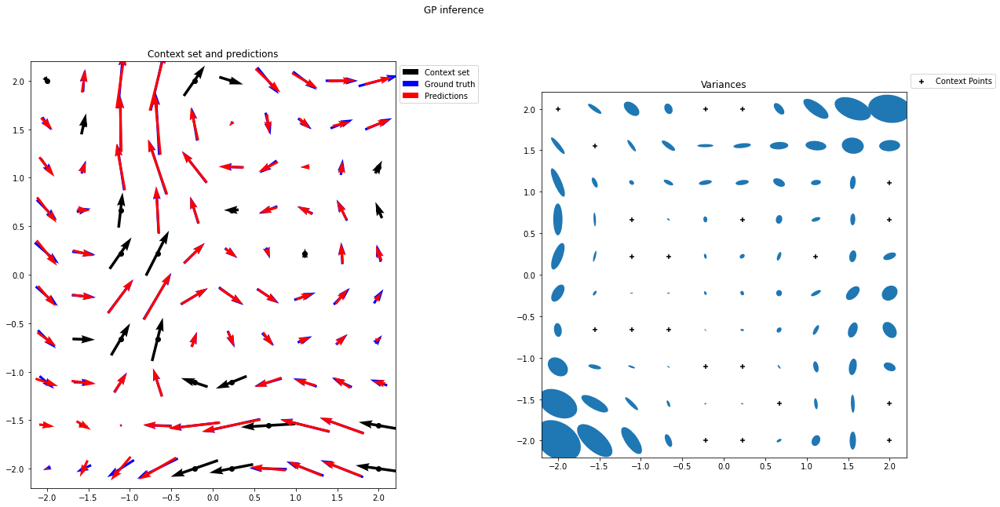

<Figure size 432x288 with 0 Axes>

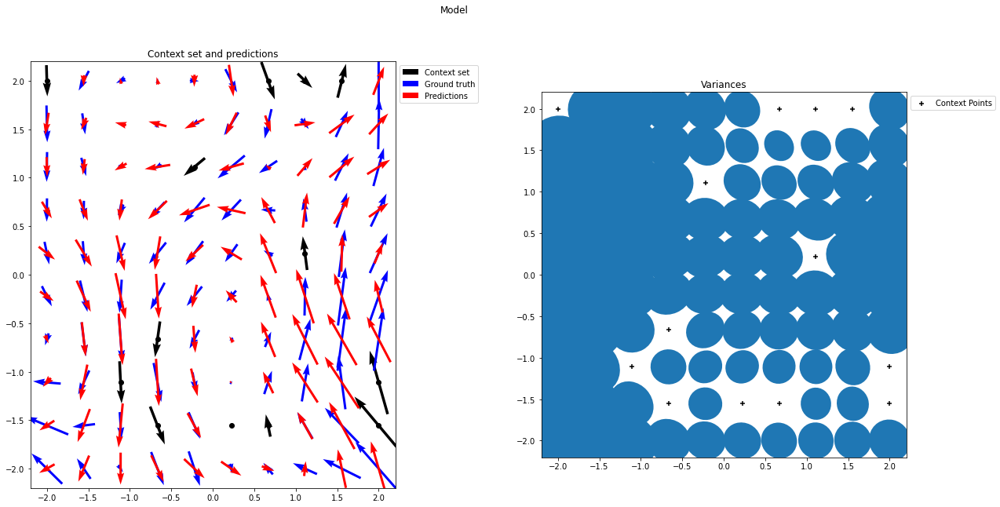

<Figure size 432x288 with 0 Axes>

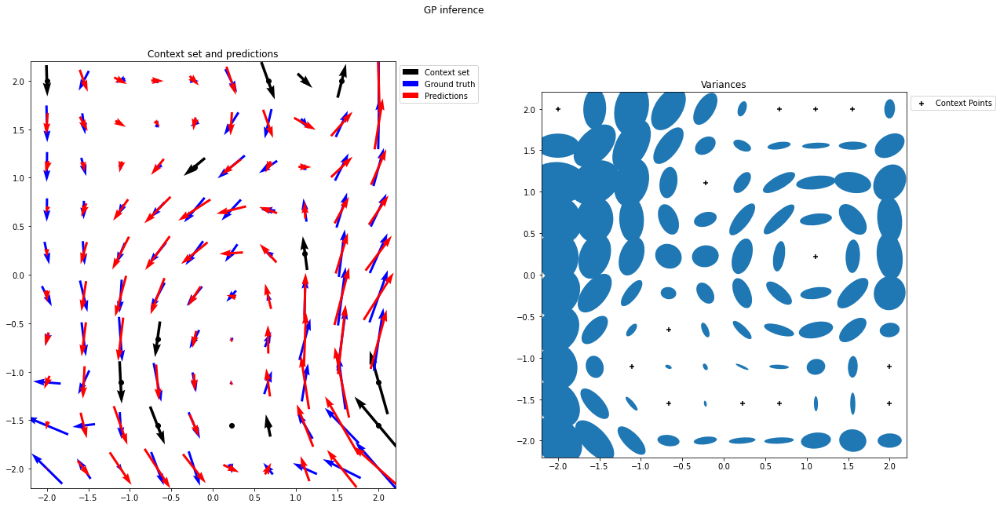

In [3]:
'''
#EVALUATE CONV CNP:
'''
conv_file_loc="Trained_Models/Comp_experiments/Comp_experiment_1_Conv_CNP_2020_07_24_13_19"
conv_dict=torch.load(conv_file_loc,map_location=torch.device('cpu'))
conv_evaluater=Evaluation.Steerable_CNP_Evaluater(conv_dict,G_act,in_repr,GP_TEST_DATA_LOADER)
conv_evaluater.plot_loss_memory()
conv_evaluater.equiv_error_model(n_samples=4,plot_stable=True)
conv_evaluater.plot_test_random(n_samples=4,GP_parameters=GP_PARAMETERS)


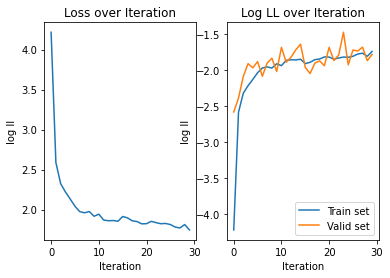

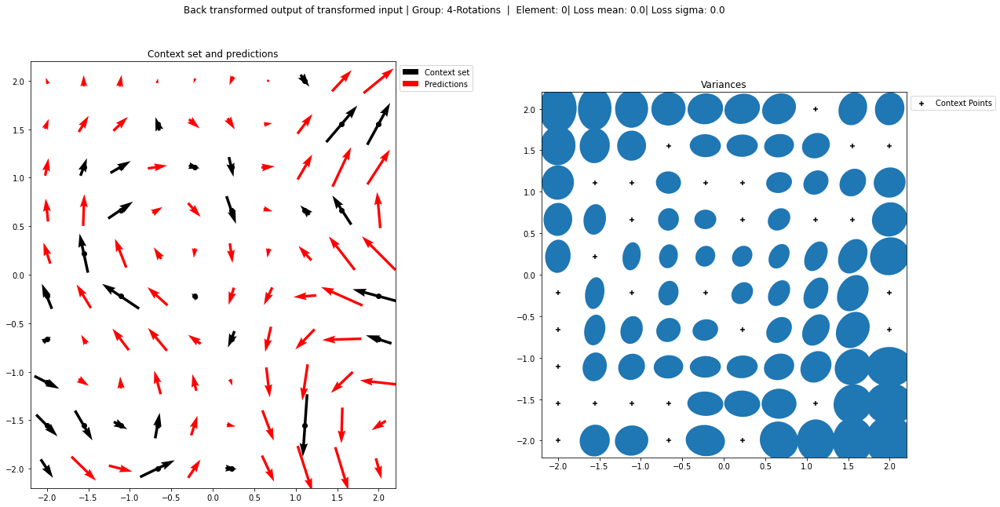

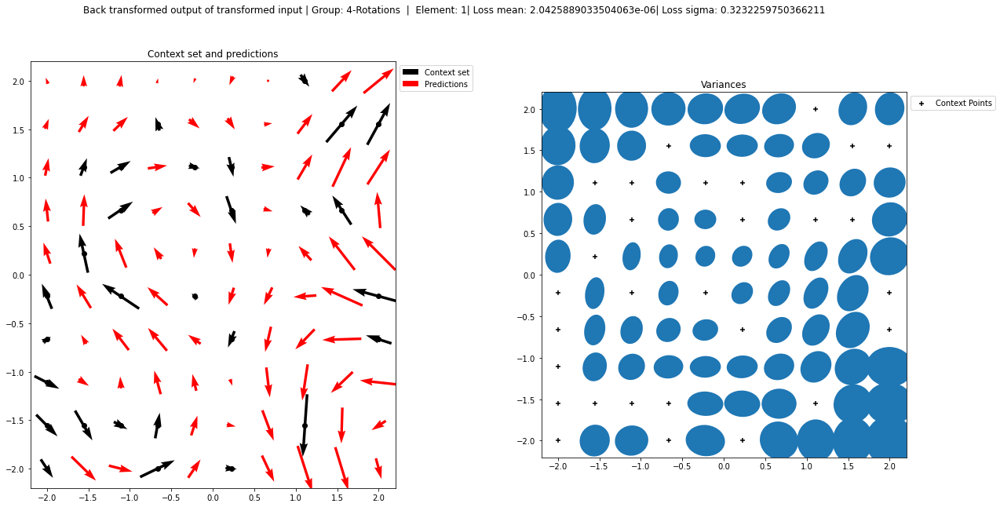

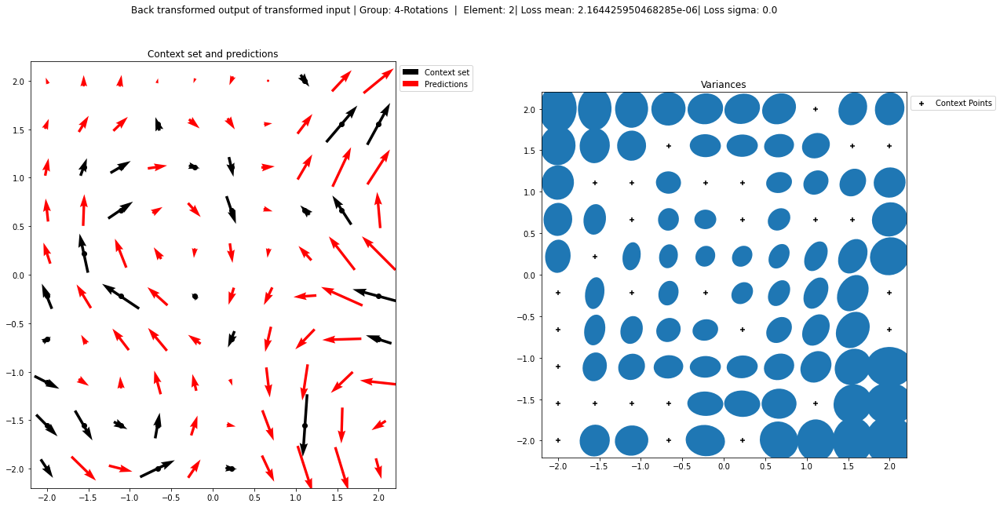

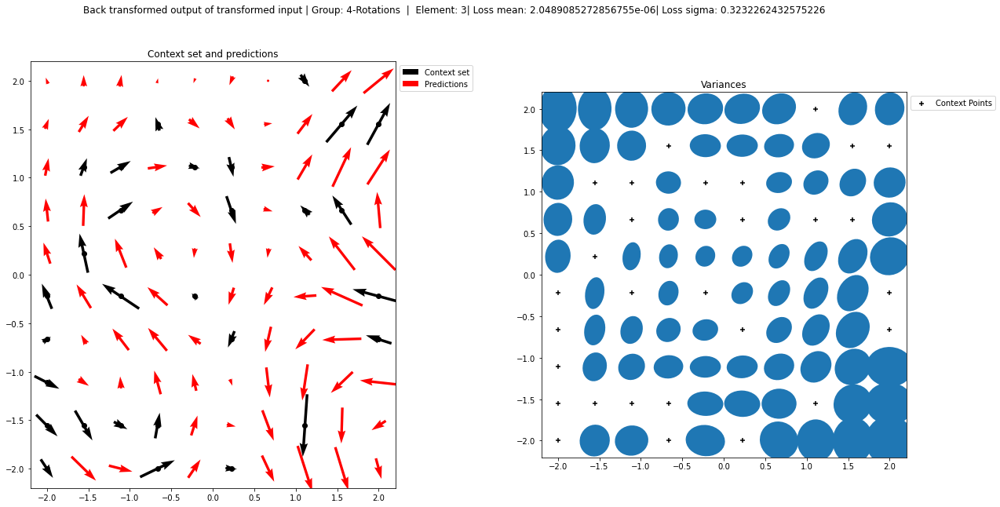

<Figure size 432x288 with 0 Axes>

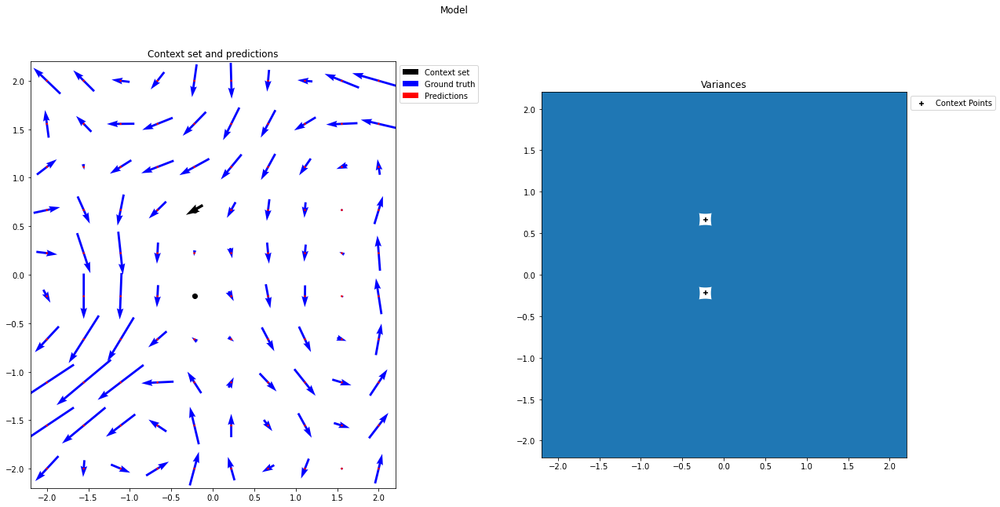

<Figure size 432x288 with 0 Axes>

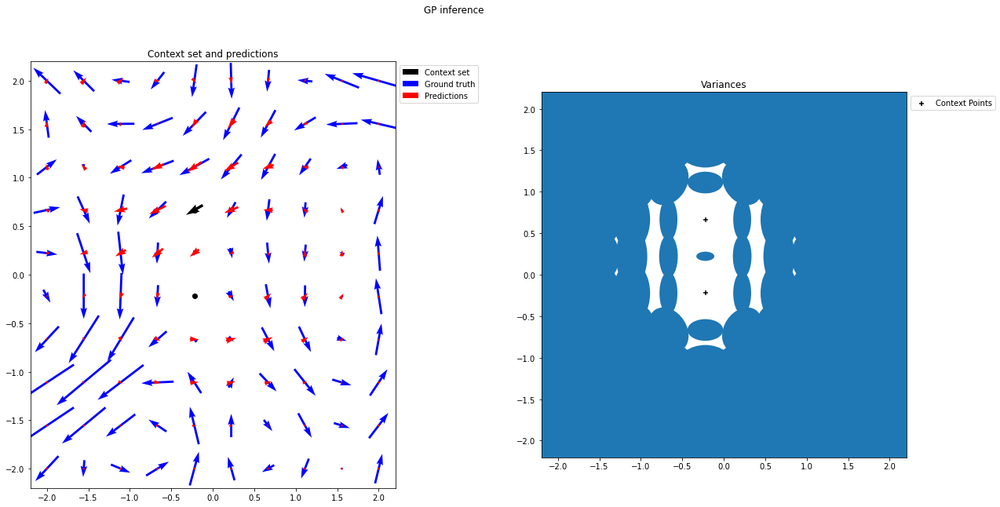

<Figure size 432x288 with 0 Axes>

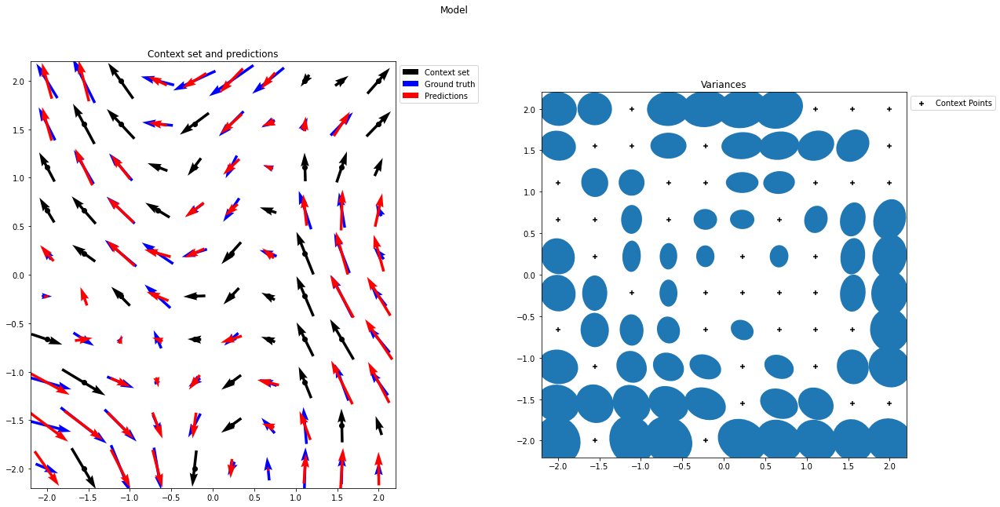

<Figure size 432x288 with 0 Axes>

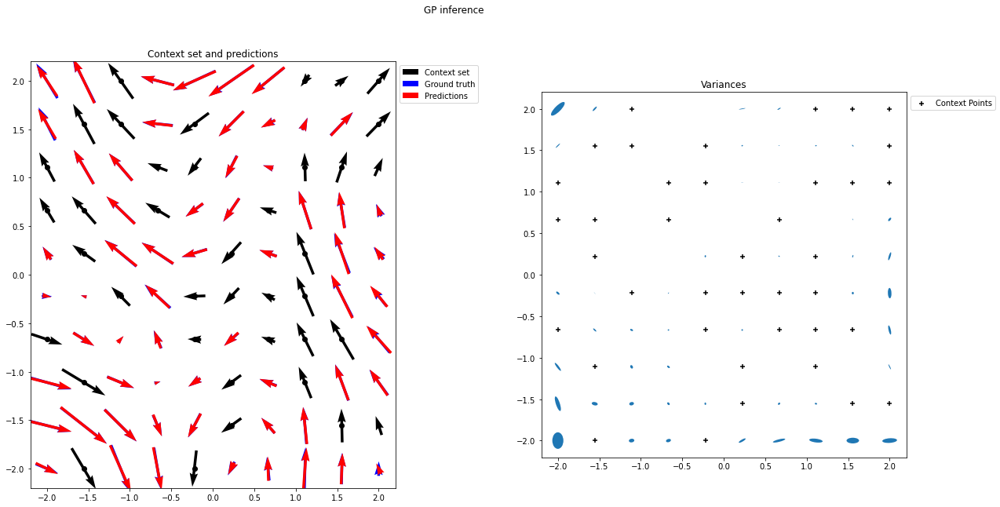

<Figure size 432x288 with 0 Axes>

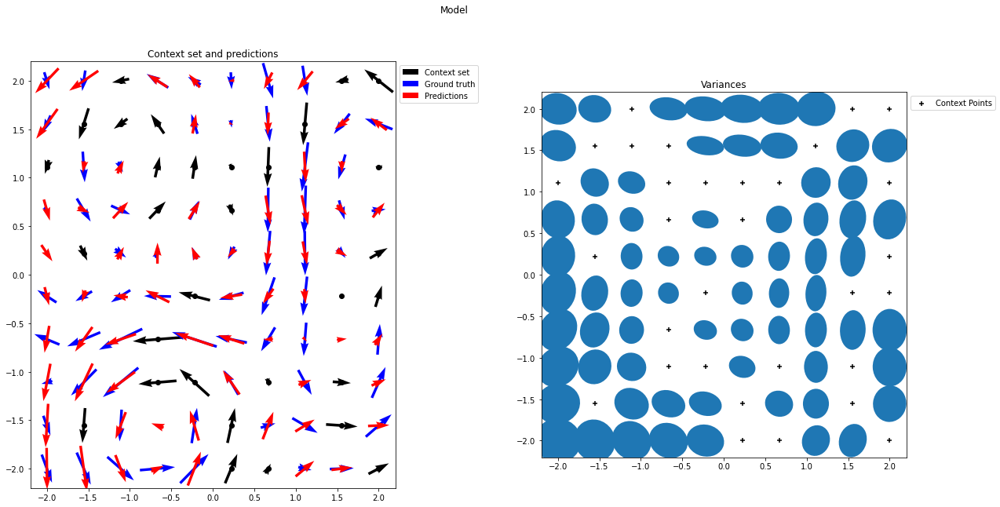

<Figure size 432x288 with 0 Axes>

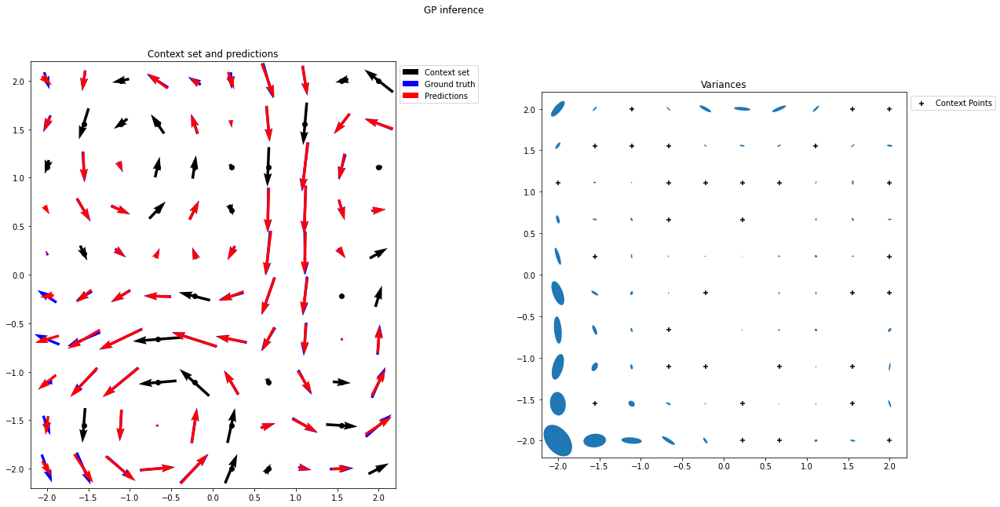

<Figure size 432x288 with 0 Axes>

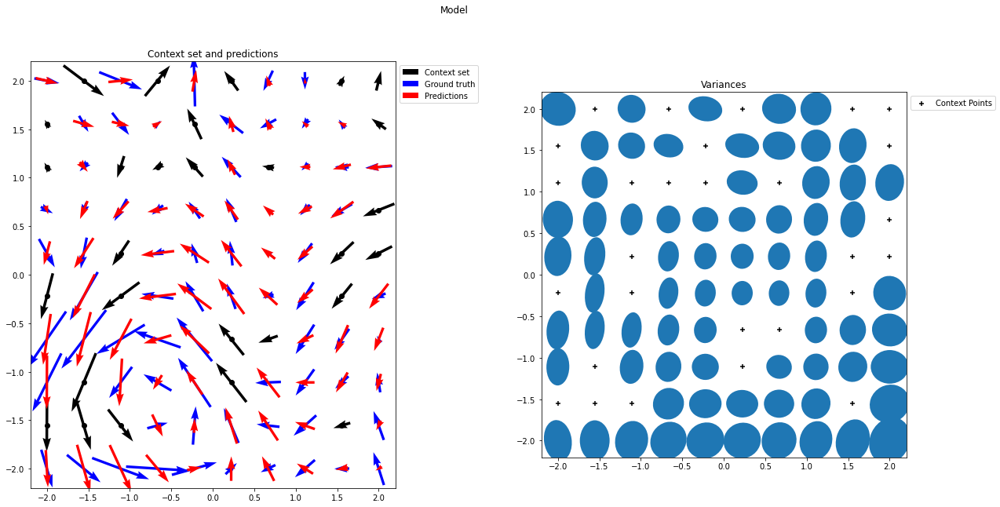

<Figure size 432x288 with 0 Axes>

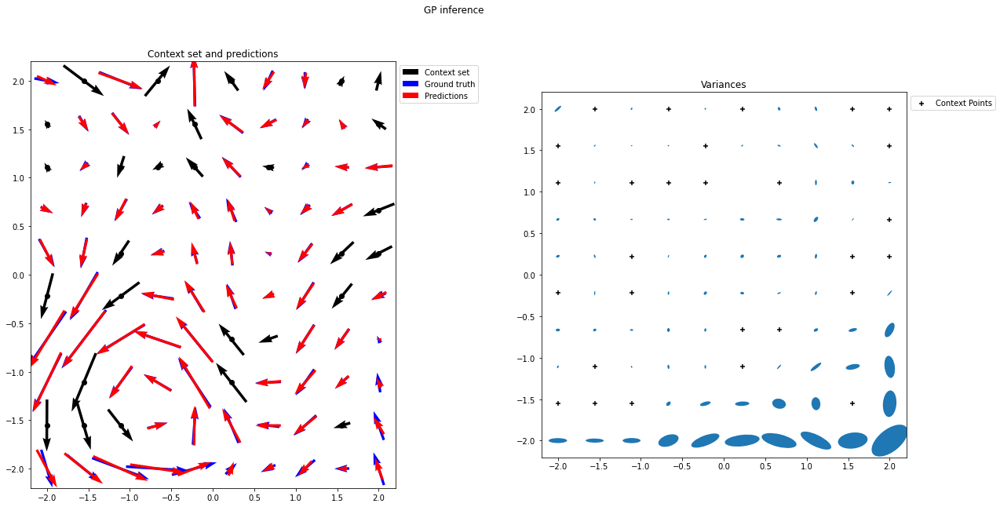

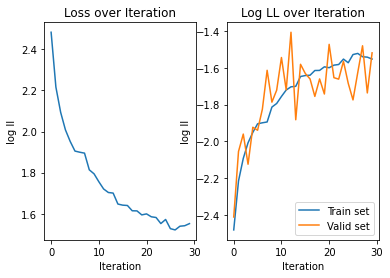

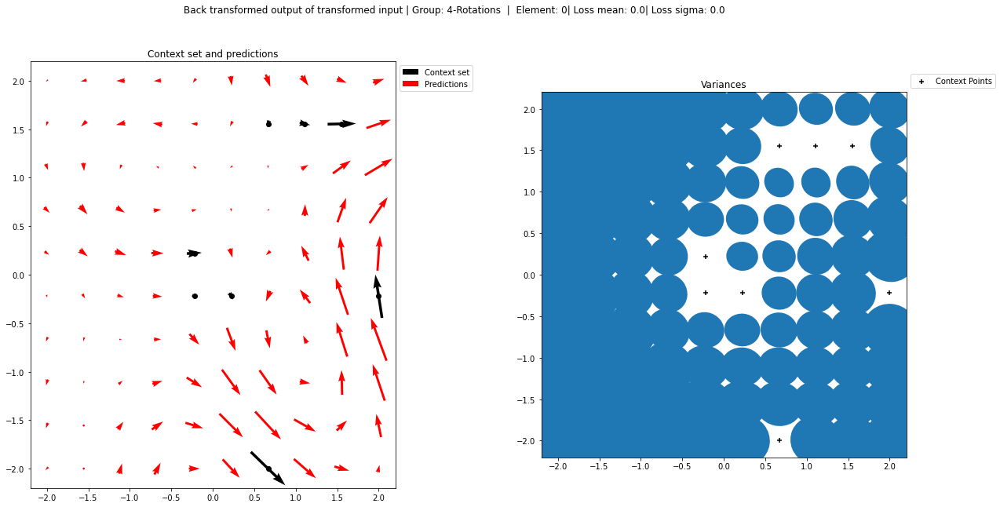

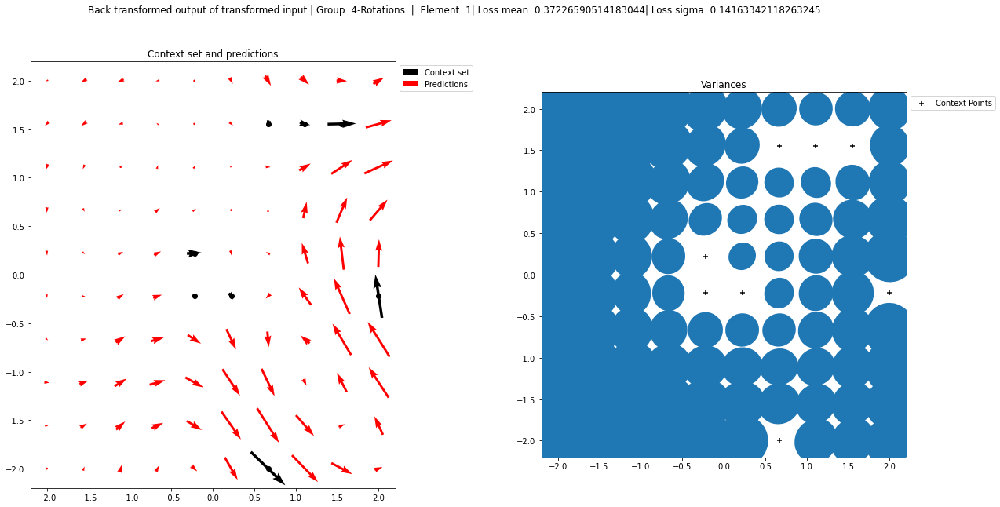

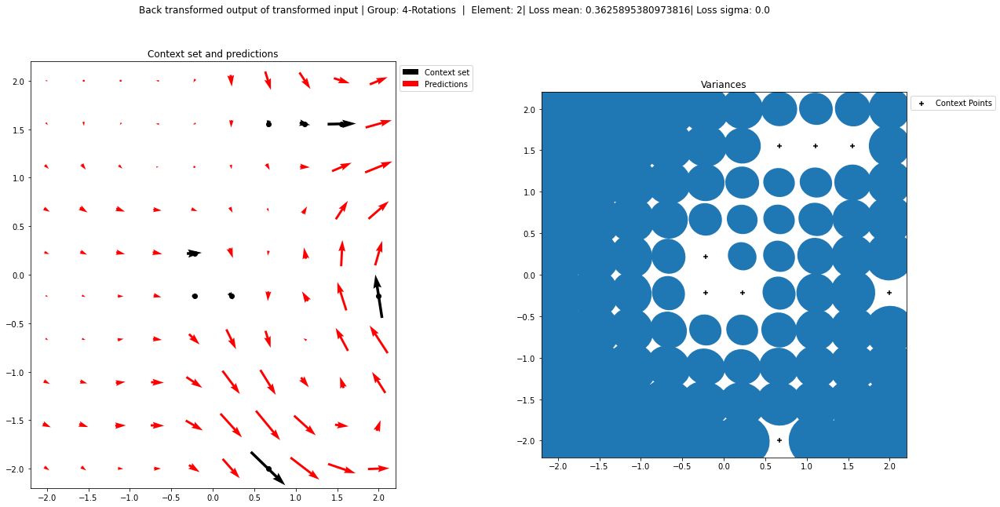

In [4]:

'''
#EVALUATE STEERABLE CNP:
'''
geom_file_loc="Trained_Models/Comp_experiments/Comp_experiment_1_Steerable_CNP_2020_07_24_13_03"
G_act=geom_decoder.G_act
in_repr=G_act.irrep(1)

geom_dict=torch.load(geom_file_loc,map_location=torch.device('cpu'))
geom_evaluater=Evaluation.Steerable_CNP_Evaluater(geom_dict,G_act,in_repr,GP_TEST_DATA_LOADER)
geom_evaluater.plot_loss_memory()
geom_evaluater.equiv_error_model(n_samples=4,plot_stable=True)
geom_evaluater.plot_test_random(n_samples=4,GP_parameters=GP_PARAMETERS)

'''
#EVALUATE CONV CNP:
'''
conv_file_loc="Trained_Models/Comp_experiments/Comp_experiment_1_Conv_CNP_2020_07_24_13_19"
conv_dict=torch.load(conv_file_loc,map_location=torch.device('cpu'))
conv_evaluater=Evaluation.Steerable_CNP_Evaluater(conv_dict,G_act,in_repr,GP_TEST_DATA_LOADER)
conv_evaluater.plot_loss_memory()
conv_evaluater.equiv_error_model(n_samples=4,plot_stable=True)
conv_evaluater.plot_test_random(n_samples=4,GP_parameters=GP_PARAMETERS)
